In [1]:
################################################################################
# Dependencies
!pip install -r requirements.txt -U

  Using cached pandas-2.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.0 MB)
  Using cached scikit_learn-1.5.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.3 MB)

[notice] A new release of pip available: 22.3.1 -> 24.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
################################################################################
# Global objects
# Imports
import pandas as pd
import pyarrow.parquet as pq
from plotly.graph_objs import Bar, Figure
from pycaret.classification import (
    compare_models,
    setup,
    tune_model,
    plot_model,
    predict_model
)
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport

# Constants
INPI_EXPORT_PARQUET: str = "./data/export-detail-bilan.parquet"
TRAIN_INPI_PARQUET: str = "./data/inpi_cleaned.parquet"
PRED_INPI_PARQUET: str = "./data/inpi_pred.parquet"
BODACC_RAW_PARQUET: str = "./data/annonces-commerciales.parquet"
BODACC_YEARLY_CLOSURE_PARQUET: str = "./data/yearly_closure.parquet"
MERGE_PARQUET: str = "./data/merge.parquet"
CLOSURE_2024_PARQUET: str = "./data/closure-2024.parquet"
TRAIN_CLOSING_YEAR: int = 2023
FINANCIAL_DATA_YEARS: tuple = tuple(range(TRAIN_CLOSING_YEAR - 1, TRAIN_CLOSING_YEAR - 4, -1))

# Data cleaning

Data cleaning of both datasets.
One contains the explanatory variables, and the other contains the target variable.
Once cleaned, they are merged into a single DataFrame.

## INPI Financial data

INPI registers the financial data of all french companies and publish it.
These are the data used to be registered by the trade tribunal, but now it is
done online most of the time.

There is various ways to access the data, but here we will use the parquet file
from the [signaux](https://beta.gouv.fr/startups/signaux-faibles.html) faible project.

This dataset contains the explanatory variables, supposedly the financial data.

Here above where are generate the DataFrame the data required for training and testing the model.
And another DataFrame with the data required for prediction, the same shifted one year later, the year after being this current year, it has to be a prediction, i.e., the company can close this year.
Both DataFrames have the very same structure and are saved to parquet files to avoid generating them multiple times.

In [3]:
# Create an empty dataframes to store the cleaned data and the prediction data
train_inpi_df = pd.DataFrame()
pred_inpi_df = pd.DataFrame()

# The file is too big to read using Pandas, so we will read it in chunks using
# Pyarrow.
parquet_file = pq.ParquetFile(INPI_EXPORT_PARQUET)
for i in parquet_file.iter_batches(batch_size=100_000):
    # A chunk of the original parquet
    temp_df = i.to_pandas()
    ############################################################################
    # Clean each column, starting by the most important impactful cleanings
    # to further manipulate a smaller amount of data.
    # Display the first 5 rows of the dataframe

    # #1 Turn liasse to a dictionary
    temp_df["liasse"] = temp_df["liasse"].apply(dict)
    # Make a column for each bundle.
    # Declared as Euros without cents so cast to integer
    # Salaire et traitement
    temp_df["liasse_fy"] = temp_df["liasse"].apply(lambda x: x.get("FY", 0)).astype(pd.Int64Dtype())
    # Charges sociales
    temp_df["liasse_fz"] = temp_df["liasse"].apply(lambda x: x.get("FZ", 0)).astype(pd.Int64Dtype())
    # Chiffres d’affaires nets
    temp_df["liasse_fj"] = temp_df["liasse"].apply(lambda x: x.get("FJ", 0)).astype(pd.Int64Dtype())
    # RESULTAT DE L’EXERCICE (bénéfice ou perte)
    temp_df["liasse_di"] = temp_df["liasse"].apply(lambda x: x.get("DI", 0)).astype(pd.Int64Dtype())
    # Impôts, taxes et versements assimilés
    temp_df["liasse_fx"] = temp_df["liasse"].apply(lambda x: x.get("FX", 0)).astype(pd.Int64Dtype())
    # Drop liasse column
    temp_df = temp_df.drop(columns=["liasse"])

    # #2 Only keep rows with confidentiality in lowercase and equal to public or partiellement confidentiel
    temp_df = temp_df[(temp_df["confidentiality"].str.lower() == "public") | (
            temp_df["confidentiality"].str.lower() == "partiellement confidentiel")]
    # Remove confidentiality column
    temp_df = temp_df.drop(columns=["confidentiality"])

    # #3 Cast date_cloture_exercice as integer
    temp_df["date_cloture_exercice"] = temp_df["date_cloture_exercice"].apply(
        lambda x: x.strftime("%Y")
    ).astype(pd.UInt16Dtype())

    # #4 Remove type_bilan rows with values different from S and C
    temp_df = temp_df[temp_df["type_bilan"].str.upper() == "C"]
    # Remove type_bilan column
    temp_df = temp_df.drop(columns=["type_bilan"])

    # #5 Cast siren as integer
    temp_df["siren"] = temp_df["siren"].astype(pd.UInt32Dtype())

    # #6 Only keep 3 years before closing like [2020, 2021, 2022] for isntance
    temp_train_df = temp_df[temp_df["date_cloture_exercice"].isin(FINANCIAL_DATA_YEARS)]
    # Rename date_cloture_exercice to year
    temp_train_df = temp_train_df.rename(columns={"date_cloture_exercice": "year"})

    # #7 Concatenate dataframes
    train_inpi_df = pd.concat([train_inpi_df, temp_train_df])

    # #8 Only keep 3 years before closing like [2021, 2022, 2023] for isntance
    temp_pred_df = temp_df[temp_df["date_cloture_exercice"].isin([2021, 2022, 2023])]
    # Rename date_cloture_exercice to year
    temp_pred_df = temp_pred_df.rename(columns={"date_cloture_exercice": "year"})

    # #9 Concatenate dataframes
    pred_inpi_df = pd.concat([pred_inpi_df, temp_pred_df])

# Drop duplicate rows
train_inpi_df = train_inpi_df.drop_duplicates(subset=["siren", "year"])
pred_inpi_df = pred_inpi_df.drop_duplicates(subset=["siren", "year"])
# Write the cleaned dataframe to a parquet file
train_inpi_df.to_parquet(TRAIN_INPI_PARQUET, index=False)
pred_inpi_df.to_parquet(PRED_INPI_PARQUET, index=False)

The cleaned data DataFrame shows the following shape and information:

In [4]:
# Read the cleaned data for the parquet file
train_inpi_df = pd.read_parquet(TRAIN_INPI_PARQUET)
print("Number of unique company identifier, AKA SIREN:", len(train_inpi_df["siren"].unique()))
print("Number of rows:", train_inpi_df.shape[0])
print("Information about the DataFrame:", train_inpi_df.info())
print("The data look like:")
train_inpi_df.head()

Number of unique company identifier, AKA SIREN: 678403
Number of rows: 1431978
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1431978 entries, 0 to 1431977
Data columns (total 7 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   siren      1431978 non-null  UInt32
 1   year       1431978 non-null  UInt16
 2   liasse_fy  1431978 non-null  Int64 
 3   liasse_fz  1431978 non-null  Int64 
 4   liasse_fj  1431978 non-null  Int64 
 5   liasse_di  1431978 non-null  Int64 
 6   liasse_fx  1431978 non-null  Int64 
dtypes: Int64(5), UInt16(1), UInt32(1)
memory usage: 72.4 MB
Information about the DataFrame: None
The data look like:


,siren,year,liasse_fy,liasse_fz,liasse_fj,liasse_di,liasse_fx
0,5420120,2021,490913,272761,271605,-1974866,104216
1,5420120,2020,656957,279954,342381,-807683,123770
2,5420120,2022,449215,224681,245784,-1081200,103060
3,5520176,2021,1686707,719568,8054388,541249,151987
4,5520176,2020,1820749,765906,6082217,-300307,210981


Turn the year column to its various values as columns and drop it.
This transformation is stored into a function as the same will be applied to the prediction DataFrame.
Columns name does not contain the year but a concatenation of the liasse_<bundle code>_<closing year - year>.
That way, the structure is the same for all dataframes regardless to the years, including the prediction one.

In [5]:
def reshape_financial_df(df: pd.DataFrame, closing_year: int) -> pd.DataFrame:
    """
    Reshape the financial dataframe to have the year as columns and the siren as index.
    Columns name does not contain the year but a concatenation of the liasse_<bundle code>_<closing year - year>.
    That way, the structure is the same for all dataframes regardless to the years, including the prediction one.

       :param df: The financial dataframe.
       :param closing_year: The year the companies are closing, from the BODACC or to be predicted.
       :return: The reshaped dataframe.
    """
    # Pivot the dataframe
    df = df.pivot(index="siren", columns="year")
    # Remove NaN values inserted by the pivot as having no bundle amount is the same as having 0
    df.fillna(0, inplace=True)
    # Create the columns names before the drop level
    news_cols = ["{}_{}".format(x[0], str(closing_year - x[1])) for x in df.columns]
    df.columns = df.columns.droplevel()
    # Rename the columns with both former and new year values
    df.columns = news_cols
    return df

In [6]:
# Only keep the siren and year columns
train_inpi_df = reshape_financial_df(train_inpi_df, TRAIN_CLOSING_YEAR)
train_inpi_df.head()

,liasse_fy_3,liasse_fy_2,liasse_fy_1,liasse_fz_3,liasse_fz_2,liasse_fz_1,liasse_fj_3,liasse_fj_2,liasse_fj_1,liasse_di_3,liasse_di_2,liasse_di_1,liasse_fx_3,liasse_fx_2,liasse_fx_1
siren,,,,,,,,,,,,,,,
5420120,656957,490913,449215,279954,272761,224681,342381,271605,245784,-807683,-1974866,-1081200,123770,104216,103060
5520176,1820749,1686707,1792024,765906,719568,868025,6082217,8054388,10261455,-300307,541249,561370,210981,151987,137289
5520242,792695,0,847142,209864,0,253325,4874985,0,7498811,98843,0,385970,188193,0,114651
5580113,31493,0,0,15669,0,0,3321087,0,0,280037,0,0,5687,0,0
5580501,0,0,0,0,0,0,0,0,0,14662,230616,-6706,0,0,0


## The BODACC data

The BODACC data contains the target variable, the closing status of the companies.
The above generates two dataframe, one with the target variable and the  other to study the closure trends over the years.

In [7]:
# Read the BODACC parquet file
# Create an empty dataframe to store the cleaned data
bodacc_target_df = pd.DataFrame()
bodacc_trend_df = pd.DataFrame()

# The file is too big to read using Pandas, so we will read it in chunks using
# Pyarrow.
parquet_file = pq.ParquetFile(BODACC_RAW_PARQUET)
for i in parquet_file.iter_batches(batch_size=100_000):
    temp_df = i.to_pandas()

    try:
        # #1 Turn date_parution to year
        temp_df["dateparution"] = pd.to_datetime(temp_df["dateparution"])
        temp_df["dateparution"] = temp_df["dateparution"].apply(
            lambda x: x.strftime("%Y")
        ).astype(pd.UInt16Dtype())

        # #2 Only keep rows with the value of the column "familleavis" equal to "radiation"
        temp_df = temp_df[temp_df["familleavis"].str.lower() == "radiation"]
        # Drop familleavis column
        temp_df = temp_df.drop(columns=["familleavis"])

        # #3 Filter row where registre is not a string
        temp_df = temp_df[temp_df["registre"].apply(lambda x: isinstance(x, str))]

        # #4 Split registre on a comma and keep the last element
        temp_df["registre"] = temp_df["registre"].apply(lambda x: x.split(",")[0])

        # #5 Filters rows where registre is not a number
        temp_df = temp_df[temp_df["registre"].str.isnumeric()]

        # #6 Cast registre as integer
        temp_df["registre"] = temp_df["registre"].astype(pd.UInt32Dtype())

    except KeyError:  # If the temporary dataframe is empty
        continue

    # Concatenate dataframes
    bodacc_trend_df = pd.concat([bodacc_trend_df, temp_df[["dateparution"]]])

    # #7 Remove raw with NAN values
    bodacc_trend_df = bodacc_trend_df.dropna()
    # #7 Only keep rows with dateparution equal to TRAIN_CLOSING_YEAR
    temp_df = temp_df[temp_df["dateparution"] == TRAIN_CLOSING_YEAR]
    if not temp_df.empty:
        bodacc_target_df = pd.concat([bodacc_target_df, temp_df[["registre"]]])

# Make registre the index
bodacc_target_df = bodacc_target_df.set_index("registre")
# Drop duplicate rows
bodacc_target_df = bodacc_target_df.drop_duplicates()

In [8]:
# Write the trend dataframe to a parquet file
bodacc_trend_df.to_parquet(BODACC_YEARLY_CLOSURE_PARQUET, index=False)
# Group by year and count the number of closed companies
bodacc_trend_df = bodacc_trend_df.groupby("dateparution").size().reset_index(name="count")
# Only keep complete years 2022 and 2023
bodacc_trend_df = bodacc_trend_df[bodacc_trend_df["dateparution"].isin([2022, 2023])]

The BODACC DataFrame is now a single list on of company identifiers.
Those companies are the ones that have been closed in 2024.

In [9]:
print("Number of unique company identifier, AKA SIREN:", len(bodacc_target_df))
print("Number of rows:", bodacc_target_df.shape[0])
print("Information about the DataFrame:", bodacc_target_df.info())
print("The data look like:")
bodacc_target_df.head()

Number of unique company identifier, AKA SIREN: 275895
Number of rows: 275895
<class 'pandas.core.frame.DataFrame'>
Index: 275895 entries, 845122308 to 378730436
Empty DataFrame
Information about the DataFrame: None
The data look like:


""
registre
845122308
809696826
513412387
850572967
404955080


## Merge the two datasets, i.e., when a company is in both datasets, it means it has been closed in 2024.
This will generate a column boolean column `closed` that will be the target variable.

In [10]:
# Merge the two dataframes
merged_df = train_inpi_df
merged_df["closed"] = merged_df.index.isin(bodacc_target_df.index)
# Encode the closed column
merged_df["closed"] = merged_df["closed"].astype(pd.UInt8Dtype())
merged_df.head()

,liasse_fy_3,liasse_fy_2,liasse_fy_1,liasse_fz_3,liasse_fz_2,liasse_fz_1,liasse_fj_3,liasse_fj_2,liasse_fj_1,liasse_di_3,liasse_di_2,liasse_di_1,liasse_fx_3,liasse_fx_2,liasse_fx_1,closed
siren,,,,,,,,,,,,,,,,
5420120,656957,490913,449215,279954,272761,224681,342381,271605,245784,-807683,-1974866,-1081200,123770,104216,103060,0
5520176,1820749,1686707,1792024,765906,719568,868025,6082217,8054388,10261455,-300307,541249,561370,210981,151987,137289,0
5520242,792695,0,847142,209864,0,253325,4874985,0,7498811,98843,0,385970,188193,0,114651,0
5580113,31493,0,0,15669,0,0,3321087,0,0,280037,0,0,5687,0,0,0
5580501,0,0,0,0,0,0,0,0,0,14662,230616,-6706,0,0,0,0


Write the merged DataFrame to a parquet file. In order to avoid cleaning and
merging the data again, we will use this file in the next steps.

In [11]:
# Write the merged dataframe to a parquet file
merged_df.to_parquet(MERGE_PARQUET)

Read the parquet file to avoid the above steps.

In [12]:
merged_df = pd.read_parquet(MERGE_PARQUET)

# Data analysis
Study first the number of open companies and the number of closed companies.

In [13]:
# Number of open and closed companies
int_number_closed_companies = merged_df["closed"].value_counts()[1]
int_number_open_companies = merged_df["closed"].value_counts()[0]
print("Number of open companies:", int_number_open_companies)
print("Number of closed companies:", int_number_closed_companies)

Number of open companies: 663108
Number of closed companies: 15295


The number of open companies is much higher than the number of closed companies.
As there is only 2 % of closed companies, the dataset is unbalanced.
Therefore, even if 98 % accurate it can miss the 2 % of closed companies.
The trick is to create a merging 2 dataframe of equal size, one with only open companies and the other with only closed companies.
The merged dataframe will then have a 50/50 ratio of open and closed companies.
To get the bigger dataset possible,we will pseudo-randomly extract a sample of open companies the size of the closed company dataset.

In [14]:
# Extract a sample of open companies the size of the closed companies dataset
open_companies = merged_df[merged_df["closed"] == False].sample(n=int_number_closed_companies)
# Extract the closed companies
closed_companies = merged_df[merged_df["closed"] == True]
# Concatenate the two dataframes
balanced_df = pd.concat([open_companies, closed_companies])
# Shuffle the dataframe
balanced_df = balanced_df.sample(frac=1)

Generate a data profiling report to check all the above data transformations.

In [15]:
# Generate the report
profile = ProfileReport(balanced_df, title="Balanced DataFrame")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The above iframe shows the report of the balanced DataFrame, there are no missing values and the same number of open and closed companies.

### Split the data into training and testing sets
The training dataset will 80% of the data, and the testing dataset will be 20 %.

In [16]:
dataset_train, dataset_unseen = train_test_split(
    balanced_df,
    test_size=0.2,
    random_state=42,
    stratify=balanced_df["closed"]
)

### Model setup

The dataset is ready for training, we will use the PyCaret library to train the model.

In [17]:
xp = setup(
    data=dataset_train,
    test_data=dataset_unseen,
    target="closed",
    normalize=True,
    session_id=42,
    remove_outliers=False,  # Data are official, so no outliers legally
    use_gpu=True,
    n_jobs=-1,
)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) Iris(R) Xe Graphics [0x9a49], Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) Iris(R) Xe Graphics [0x9a49], Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more

# Evaluate the various models

Allways using Pycaret, we are generating a list of models and the metrics.
We are excluding xgboost and catboost has they comsume too much ressouces whisltes giving poor result most of the time.
The above method returns the best model for this current classification.

In [18]:
best_model = compare_models(exclude=["xgboost", "catboost"])

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,17:00:40
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/53 [00:00<?, ?it/s]

Pycaret can still improve the best model fine-tuning the hyperparameters.

In [19]:
tuned_best_model = tune_model(best_model)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,17:02:10
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Number of positive: 11012, number of negative: 11012
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 22024, number of used features: 

The above cell load the model in case the notebook is restarted.
And it plots the confusion matrix, the AUC, and the feature importance.

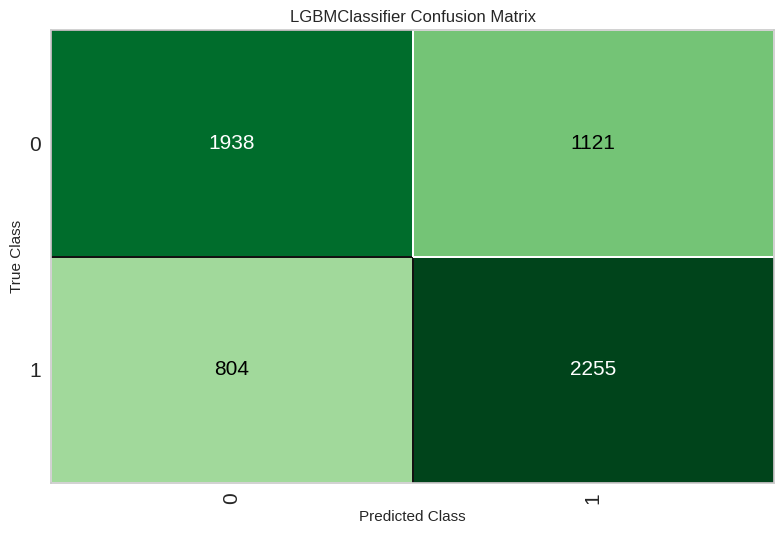

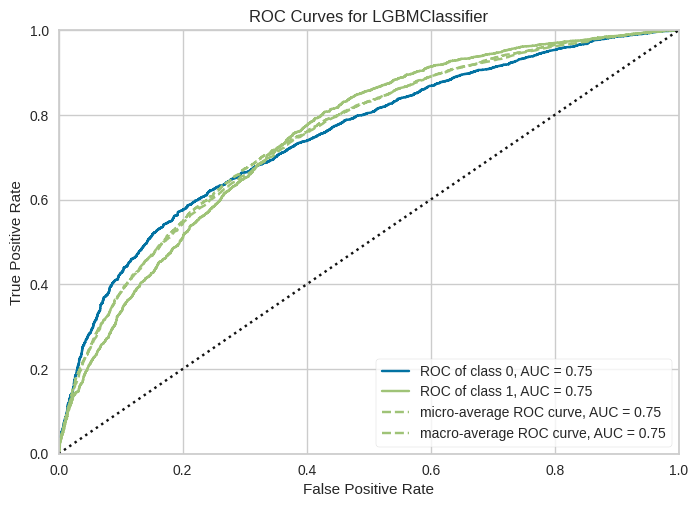

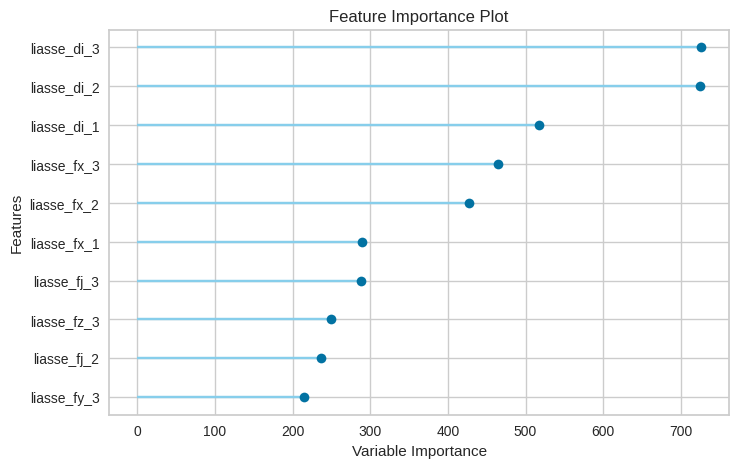

In [20]:
plot_model(tuned_best_model, plot="confusion_matrix")
plot_model(tuned_best_model, plot="auc")
plot_model(tuned_best_model, plot="feature")

The above metrics show that the model is good at predicting closed companies.
The dataset used to predict the future potential closure had to undergo the same transformations as the training dataset. A pivot to have year in column, renaming, etc.

In [21]:
# Predict the unseen data in 2024
pred_inpi_df = pd.read_parquet(PRED_INPI_PARQUET)
pred_inpi_df = reshape_financial_df(pred_inpi_df, 2024)
print(pred_inpi_df.head())

         liasse_fy_3  liasse_fy_2  liasse_fy_1  liasse_fz_3  liasse_fz_2  \
siren                                                                      
5420120       490913       449215            0       272761       224681   
5520176      1686707      1792024            0       719568       868025   
5520242            0       847142            0            0       253325   
5580501            0            0            0            0            0   
5620034            0       861626            0            0       328243   

         liasse_fz_1  liasse_fj_3  liasse_fj_2  liasse_fj_1  liasse_di_3  \
siren                                                                      
5420120            0       271605       245784            0     -1974866   
5520176            0      8054388     10261455            0       541249   
5520242            0            0      7498811            0            0   
5580501            0            0            0            0       230616   
5620034    

The model is now ready to predict the closed companies in 2024.
Result will be saved to a parquet file.

In [22]:
prediction_2024_df = predict_model(tuned_best_model, data=pred_inpi_df)
prediction_2024_df.to_parquet(CLOSURE_2024_PARQUET)
# Keep only the index and closed columns
prediction_2024_closed_df = prediction_2024_df[["prediction_label"]]
# Sum the closed companies and add it to the bodacc_trend_df dataframe
#bodacc_trend_df = bodacc_trend_df._append(
#    {
#        "dateparution": 2024,
#        "count": prediction_2024_closed_df["prediction_label"].sum()
#    },
#    ignore_index=True
#)
bodacc_trend_2024_df = pd.DataFrame(
    {
        "dateparution": [2024],
        "count": [prediction_2024_closed_df["prediction_label"].sum()]
    }
)

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6


The resulting dataset is used to plot the trend of the closed companies over the years.

In [24]:
# Figure is generated using Plotly
fig = Figure(layout_yaxis_range=[200_000, 500_000])
fig.update_layout(
    title="Number of closed companies over the years",
    xaxis_title="Year",
    yaxis_title="Number of closed companies",
    font=dict(family="Ubuntu", size=10, color="black"),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)
fig.update_xaxes(dtick=1)  # To have years as integers
bar = Bar(
    x=bodacc_trend_df["dateparution"],
    y=bodacc_trend_df["count"],
    name="Closed companies from BODACC",
    marker_color="blue",
)
fig.add_trace(bar)
bar = Bar(
    x=bodacc_trend_2024_df["dateparution"],
    y=bodacc_trend_2024_df["count"],
    name="Predicted company closure",
    marker_color="red",
)
fig.add_trace(bar)
fig.write_image("./image/closed-companies-trend.png")
fig.show()